In [ ]:
import os

import torch
import torchvision
import torch.nn as nn

import numpy as np
from statistics import mean
import PIL.Image
import imageio
from tqdm.autonotebook import tqdm as tqdm

import torch.nn.functional as F
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image

import random
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

matplotlib.rcParams['figure.facecolor'] = '#ffffff'

In [ ]:
pip install torchinfo

Note: you may need to restart the kernel to use updated packages.


Loading the Dataset

In [ ]:
data_dir = '/kaggle/input/anime-faces/'
print(os.listdir(data_dir))
filenames=os.listdir(data_dir+'/images')
print(filenames[:10])

['images']
['35715_2011.jpg', '48610_2014.jpg', '34719_2011.jpg', '40266_2012.jpg', '4199_2002.jpg', '40739_2013.jpg', '42515_2013.jpg', '52482_2015.jpg', '46555_2014.jpg', '11579_2005.jpg']


Setting the batch size, image size, the mean and standard deviation for normalization.

In [ ]:
image_size = (64,64)
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

Transforming images to tensor, Normalizing the images, and performing different kinds of data augmentation for the training set.


In [ ]:
train_tfms = tt.Compose([
    tt.Resize(image_size,interpolation=2),
    tt.CenterCrop(image_size),
    tt.RandomHorizontalFlip(p=0.4),
    tt.ToTensor(), 
    tt.Normalize(*stats,inplace=True),
])
# Creating data loaders.
train_ds = ImageFolder(root=data_dir, transform=train_tfms)
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

/opt/conda/lib/python3.7/site-packages/torchvision/transforms/transforms.py:330: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


Plotting a batch of dataset after denormalizing the channels to check the images after the transformations.

In [ ]:
def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1)
    return images * stds + means

def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(images, *stats)
        ax.imshow(make_grid(denorm_images, nrow=16).permute(1, 2, 0))
        break
        
def show_images(images, nmax=80):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([]); ax.set_yticks([])
    denorm_images = denormalize(images, *stats)
    ax.imshow(make_grid((denorm_images[:nmax].detach()), nrow=10).permute(1, 2, 0))

Making grid of a batch to check the dataset

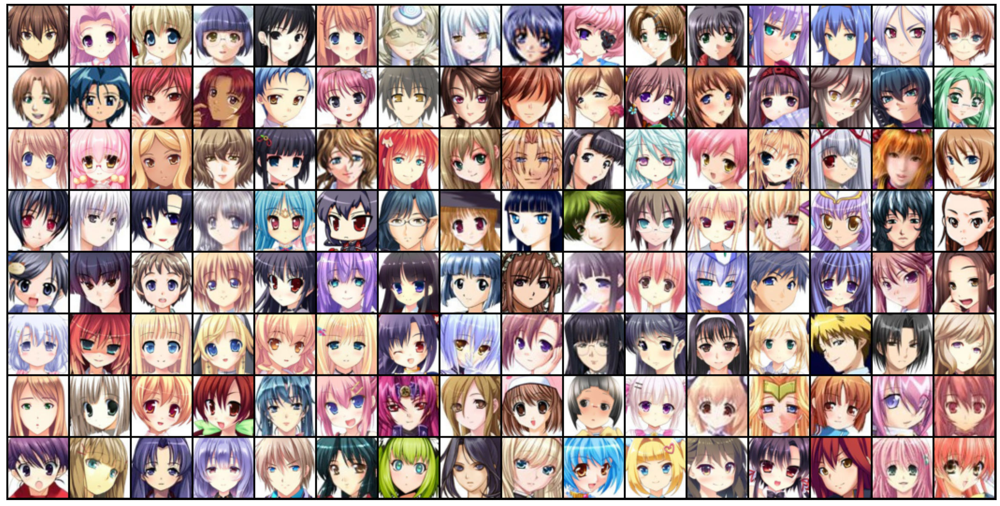

In [ ]:
show_batch(train_dl)

Checking the Device available and moving the models and dataset to that device using these functions.

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Checking the Device available.

In [ ]:
device = get_default_device()
device

device(type='cuda')

Moving the dataset to the device available.

In [ ]:
train_dl = DeviceDataLoader(train_dl,device)

**Discriminator**

Designing the Discriminator model. It's a simple CNN with sigmoid activation for binary classification for classifying the real and fake images.

In [ ]:

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()
        """
        Initialize the Discriminator Module
        """
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=2, padding=0),
            nn.Flatten(),
            nn.Sigmoid()
        )
        
    def forward(self,x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """
        x = self.conv_block1(x)
        return x
        

In [ ]:
D = Discriminator()

In [ ]:
from torchinfo import summary

summary(D, input_size=(batch_size,3,64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [128, 1]                  --
├─Sequential: 1-1                        [128, 1]                  --
│    └─Conv2d: 2-1                       [128, 64, 32, 32]         3,136
│    └─BatchNorm2d: 2-2                  [128, 64, 32, 32]         128
│    └─LeakyReLU: 2-3                    [128, 64, 32, 32]         --
│    └─Conv2d: 2-4                       [128, 128, 16, 16]        131,200
│    └─BatchNorm2d: 2-5                  [128, 128, 16, 16]        256
│    └─LeakyReLU: 2-6                    [128, 128, 16, 16]        --
│    └─Conv2d: 2-7                       [128, 256, 8, 8]          524,544
│    └─BatchNorm2d: 2-8                  [128, 256, 8, 8]          512
│    └─LeakyReLU: 2-9                    [128, 256, 8, 8]          --
│    └─Conv2d: 2-10                      [128, 512, 4, 4]          2,097,664
│    └─BatchNorm2d: 2-11                 [128, 512, 4, 4]     

**Generator**

In [ ]:
latent_size = 192

In [ ]:
class Generator(nn.Module):
    def __init__(self,latent_size):
        super(Generator,self).__init__()
        """
        Initialize the Generator Module
        :param latent_size: The length of the input latent vector
        """
        self.conv_block1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=latent_size, out_channels=512, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
            
    def forward(self,x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 3x64x64 Tensor image as output
        """
        x = self.conv_block1(x)
        return x

In [ ]:
G = Generator(latent_size)

In [ ]:
summary(G, input_size=(batch_size, latent_size, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [128, 3, 64, 64]          --
├─Sequential: 1-1                        [128, 3, 64, 64]          --
│    └─ConvTranspose2d: 2-1              [128, 512, 4, 4]          1,573,376
│    └─BatchNorm2d: 2-2                  [128, 512, 4, 4]          1,024
│    └─ReLU: 2-3                         [128, 512, 4, 4]          --
│    └─ConvTranspose2d: 2-4              [128, 256, 8, 8]          2,097,408
│    └─BatchNorm2d: 2-5                  [128, 256, 8, 8]          512
│    └─ReLU: 2-6                         [128, 256, 8, 8]          --
│    └─ConvTranspose2d: 2-7              [128, 128, 16, 16]        524,416
│    └─BatchNorm2d: 2-8                  [128, 128, 16, 16]        256
│    └─ReLU: 2-9                         [128, 128, 16, 16]        --
│    └─ConvTranspose2d: 2-10             [128, 64, 32, 32]         131,136
│    └─BatchNorm2d: 2-11                 [128, 64, 32, 3

Generating some outputs using the generator and view them as images to check the size and to see how it looks.

torch.Size([128, 3, 64, 64])


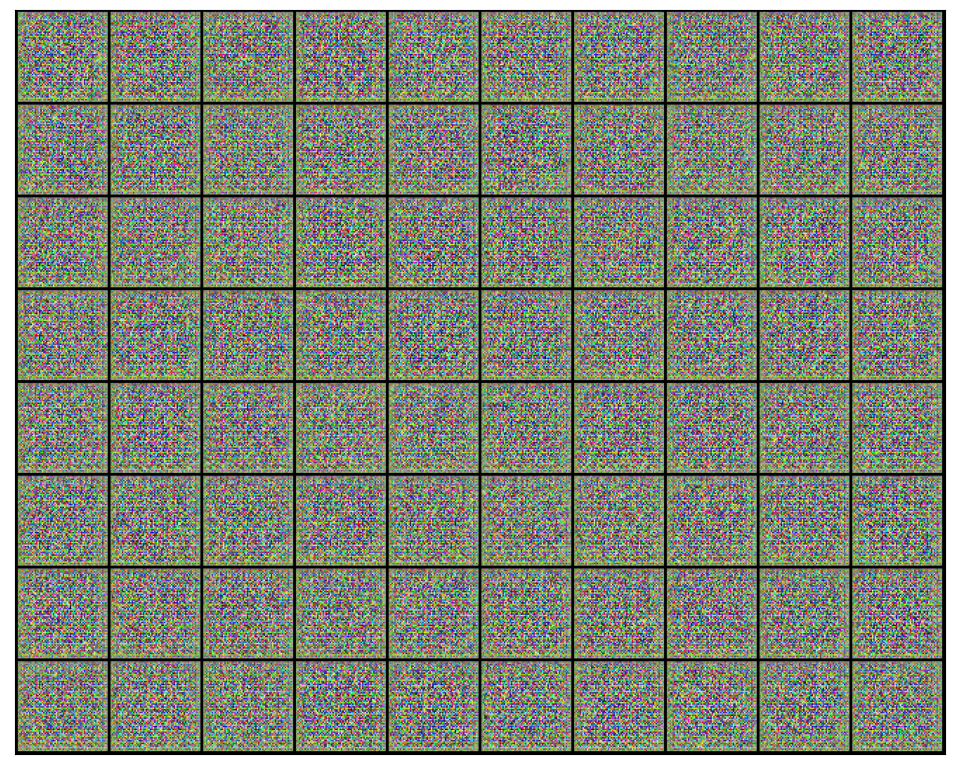

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
G=to_device(G,'cpu')
fake_images = G(xb)
print(fake_images.shape)
show_images(fake_images)

Moving the models to the available device.

In [ ]:
G = to_device(Generator(latent_size), device)
D = to_device(Discriminator(), device)

Discriminator Training

In [ ]:
def train_discriminator(real_images, d_optimizer):
    # Clear discriminator gradients
    d_optimizer.zero_grad()
    # Pass real images through discriminator
    D_out_real = D(real_images)  
    label_real = torch.full(D_out_real.shape, 1.0).to(torch.device(device))
    real_loss = Real_loss(label_real,D_out_real)
    real_score = torch.mean(D_out_real).item()
            
    # Generate fake images
    noise = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
    fake_images =  G(noise)
            
    # Pass fake images through discriminator
    D_out_fake = D(fake_images)
    label_fake =  torch.full(D_out_fake.shape, 0).to(torch.device(device))
    fake_loss = Fake_loss(label_fake, D_out_fake) 
    fake_score = torch.mean(D_out_fake).item()
            
    # Update discriminator weights
    loss_d = real_loss + fake_loss
            
    #d_optimizer.zero_grad()
    loss_d.backward(retain_graph = True)
    d_optimizer.step()
    
    return loss_d.item(), real_score, fake_score

Generator Training

In [ ]:
def train_generator(g_optimizer):
    # Clear generator gradients
    g_optimizer.zero_grad()
    # Generate fake images
    noise2 = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
    fake_images2 =  G(noise2)
            
    gen_steps = 1
    for i in range(0, gen_steps ):
        # Try to fool the discriminator
        D_out_fake2 = D(fake_images2)
        # The label is set to 1(real-like) to fool the discriminator
        label_real1 = torch.full(D_out_fake2.shape, 1.0).to(torch.device(device))
        loss_g = Real_loss(label_real1, D_out_fake2)
        # Update generator weights
        #g_optimizer.zero_grad()
        loss_g.backward(retain_graph = (i<gen_steps -1 ))
        g_optimizer.step()
    
    return loss_g.item()

Creating a directory where intermediate outputs from the generator are saved to visually inspect the progress of the model.

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

Functions for creating, denormalizing and saving the images from a fixed random vector after every epoch.

In [ ]:
def denorm2(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1).to(device)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1).to(device)
    return images * stds + means

def save_samples(index, latent_tensors, show=True):
    with torch.no_grad():
        fake_images = G(latent_tensors)
    denorm_images = denorm2(fake_images, *stats)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm_images, os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(15, 15))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm_images.cpu().detach(), nrow=8).permute(1, 2, 0))

Using a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Saving one set of images before training of model has started

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


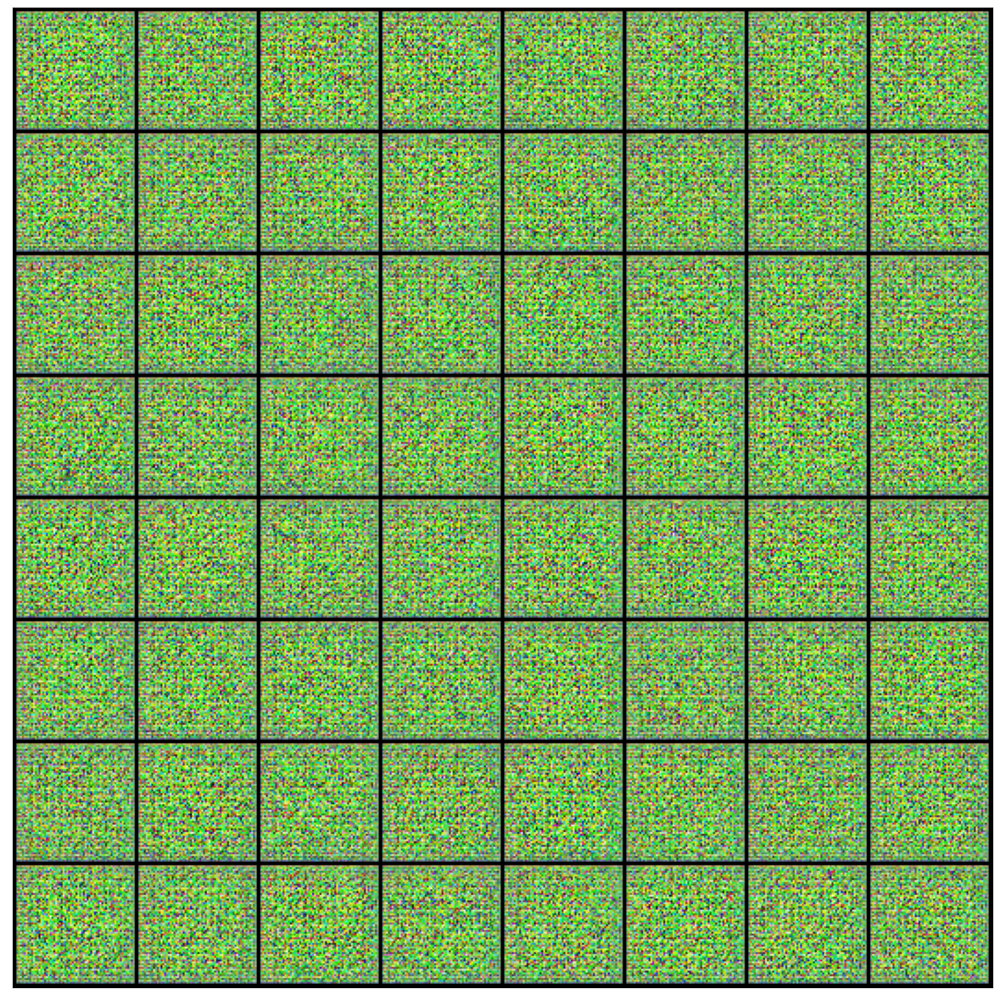

In [ ]:
save_samples(0, fixed_latent)

Adversarial Label Smoothing Loss Functions for GANs.

In [ ]:
loss_fn = torch.nn.MSELoss()
def Real_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds-label_noise)
    return loss
def Fake_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds+label_noise)
    return loss

Training the GAN Model

Training for the generator and discriminator models are done using the fit function. We will specify the number of training epochs, the learning rate, and the starting index for saving generated images.

The fit function uses the Adam optimizer for both the generator and discriminator, with the specified learning rate. The function trains the discriminator and generator models alternatively and logs the losses and scores for each epoch.

The fit function also generates some sample images at every epoch. The sample images can be used to monitor the training progress.

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    history = []
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    result = {}
    
    # Create optimizers
    opt_d = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
            losses_g.append(loss_g)
            losses_d.append(loss_d)
            real_scores.append(real_score)
            fake_scores.append(fake_score)

            
        # Record losses & scores
        lossg = mean(losses_g)
        lossd = mean(losses_d)
        resco = mean(real_scores)
        fesco = mean(fake_scores)
        result['losses_g'] = lossg
        result['losses_d'] = lossd
        result['real_scores'] = resco
        result['fake_scores'] = fesco
        losses_g.clear()
        losses_d.clear()
        real_scores.clear()
        fake_scores.clear()
        history.append(result)
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
           epoch+1, epochs, lossg, lossd, resco, fesco))
        
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
            
        # Saving the model.
        if (epoch+start_idx)%10==0:
            torch.save(G.state_dict(), '/kaggle/working/G-{0:0=2d}.pth'.format(epoch+start_idx))
            torch.save(D.state_dict(), '/kaggle/working/D-{0:0=2d}.pth'.format(epoch+start_idx))
        
    
    return history

Stating the no. of epochs and learning rate.

In [ ]:
lr = 0.0002
epochs = 40

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/40], loss_g: 0.7108, loss_d: 0.0807, real_score: 0.8646, fake_score: 0.0133
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/40], loss_g: 0.5114, loss_d: 0.1830, real_score: 0.6746, fake_score: 0.3214
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/40], loss_g: 0.5145, loss_d: 0.1574, real_score: 0.6703, fake_score: 0.3214
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/40], loss_g: 0.5390, loss_d: 0.1282, real_score: 0.7121, fake_score: 0.2765
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/40], loss_g: 0.5481, loss_d: 0.1135, real_score: 0.7358, fake_score: 0.2528
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/40], loss_g: 0.5555, loss_d: 0.1061, real_score: 0.7506, fake_score: 0.2351
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/40], loss_g: 0.5538, loss_d: 0.1031, real_score: 0.7598, fake_score: 0.2280
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/40], loss_g: 0.5443, loss_d: 0.1016, real_score: 0.7581, fake_score: 0.2302
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/40], loss_g: 0.5408, loss_d: 0.0967, real_score: 0.7680, fake_score: 0.2221
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/40], loss_g: 0.5352, loss_d: 0.0930, real_score: 0.7718, fake_score: 0.2208
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/40], loss_g: 0.5315, loss_d: 0.0887, real_score: 0.7768, fake_score: 0.2175
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/40], loss_g: 0.5242, loss_d: 0.0861, real_score: 0.7817, fake_score: 0.2125
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/40], loss_g: 0.5146, loss_d: 0.0875, real_score: 0.7810, fake_score: 0.2163
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/40], loss_g: 0.5000, loss_d: 0.0884, real_score: 0.7765, fake_score: 0.2200
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/40], loss_g: 0.4880, loss_d: 0.0889, real_score: 0.7752, fake_score: 0.2215
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/40], loss_g: 0.4803, loss_d: 0.0864, real_score: 0.7769, fake_score: 0.2206
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/40], loss_g: 0.4815, loss_d: 0.0845, real_score: 0.7795, fake_score: 0.2178
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/40], loss_g: 0.4790, loss_d: 0.0878, real_score: 0.7786, fake_score: 0.2190
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/40], loss_g: 0.4739, loss_d: 0.0891, real_score: 0.7788, fake_score: 0.2196
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/40], loss_g: 0.4708, loss_d: 0.0846, real_score: 0.7801, fake_score: 0.2201
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/40], loss_g: 0.4712, loss_d: 0.0827, real_score: 0.7836, fake_score: 0.2141
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/40], loss_g: 0.4769, loss_d: 0.0843, real_score: 0.7843, fake_score: 0.2134
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/40], loss_g: 0.4679, loss_d: 0.0811, real_score: 0.7878, fake_score: 0.2130
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/40], loss_g: 0.4686, loss_d: 0.0868, real_score: 0.7824, fake_score: 0.2163
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/40], loss_g: 0.4712, loss_d: 0.0774, real_score: 0.7942, fake_score: 0.2045
Saving generated-images-0025.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/40], loss_g: 0.4766, loss_d: 0.0788, real_score: 0.7938, fake_score: 0.2044
Saving generated-images-0026.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/40], loss_g: 0.4686, loss_d: 0.0804, real_score: 0.7945, fake_score: 0.2060
Saving generated-images-0027.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/40], loss_g: 0.4689, loss_d: 0.0806, real_score: 0.7934, fake_score: 0.2076
Saving generated-images-0028.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/40], loss_g: 0.4671, loss_d: 0.0818, real_score: 0.7907, fake_score: 0.2067
Saving generated-images-0029.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/40], loss_g: 0.4693, loss_d: 0.0773, real_score: 0.7971, fake_score: 0.2048
Saving generated-images-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/40], loss_g: 0.4698, loss_d: 0.0759, real_score: 0.8004, fake_score: 0.1997
Saving generated-images-0031.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/40], loss_g: 0.4670, loss_d: 0.0739, real_score: 0.8001, fake_score: 0.1992
Saving generated-images-0032.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/40], loss_g: 0.4693, loss_d: 0.0714, real_score: 0.8046, fake_score: 0.1950
Saving generated-images-0033.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/40], loss_g: 0.4709, loss_d: 0.0727, real_score: 0.8037, fake_score: 0.1953
Saving generated-images-0034.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/40], loss_g: 0.4673, loss_d: 0.0806, real_score: 0.7968, fake_score: 0.2041
Saving generated-images-0035.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/40], loss_g: 0.4697, loss_d: 0.0708, real_score: 0.8083, fake_score: 0.1926
Saving generated-images-0036.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/40], loss_g: 0.4698, loss_d: 0.0780, real_score: 0.8003, fake_score: 0.1991
Saving generated-images-0037.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/40], loss_g: 0.4683, loss_d: 0.0705, real_score: 0.8087, fake_score: 0.1927
Saving generated-images-0038.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/40], loss_g: 0.4707, loss_d: 0.0695, real_score: 0.8093, fake_score: 0.1902
Saving generated-images-0039.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/40], loss_g: 0.4736, loss_d: 0.0763, real_score: 0.8061, fake_score: 0.1945
Saving generated-images-0040.png


In [ ]:
history = fit(10, lr,start_idx=41)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/10], loss_g: 0.4734, loss_d: 0.0687, real_score: 0.8108, fake_score: 0.1894
Saving generated-images-0041.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/10], loss_g: 0.4736, loss_d: 0.0713, real_score: 0.8098, fake_score: 0.1897
Saving generated-images-0042.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/10], loss_g: 0.4737, loss_d: 0.0686, real_score: 0.8133, fake_score: 0.1863
Saving generated-images-0043.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/10], loss_g: 0.4620, loss_d: 0.0942, real_score: 0.8015, fake_score: 0.2081
Saving generated-images-0044.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/10], loss_g: 0.4703, loss_d: 0.0725, real_score: 0.8078, fake_score: 0.1909
Saving generated-images-0045.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/10], loss_g: 0.4738, loss_d: 0.0655, real_score: 0.8153, fake_score: 0.1843
Saving generated-images-0046.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/10], loss_g: 0.4723, loss_d: 0.0748, real_score: 0.8071, fake_score: 0.1922
Saving generated-images-0047.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/10], loss_g: 0.4752, loss_d: 0.0655, real_score: 0.8160, fake_score: 0.1832
Saving generated-images-0048.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/10], loss_g: 0.4755, loss_d: 0.0614, real_score: 0.8187, fake_score: 0.1800
Saving generated-images-0049.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/10], loss_g: 0.4738, loss_d: 0.0687, real_score: 0.8148, fake_score: 0.1856
Saving generated-images-0050.png


In [ ]:
history = fit(10, lr,start_idx=51)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/10], loss_g: 0.4795, loss_d: 0.0680, real_score: 0.8153, fake_score: 0.1836
Saving generated-images-0051.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/10], loss_g: 0.4758, loss_d: 0.0681, real_score: 0.8160, fake_score: 0.1845
Saving generated-images-0052.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/10], loss_g: 0.4746, loss_d: 0.0631, real_score: 0.8205, fake_score: 0.1807
Saving generated-images-0053.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/10], loss_g: 0.4729, loss_d: 0.0762, real_score: 0.8083, fake_score: 0.1887
Saving generated-images-0054.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/10], loss_g: 0.4723, loss_d: 0.0690, real_score: 0.8163, fake_score: 0.1857
Saving generated-images-0055.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/10], loss_g: 0.4760, loss_d: 0.0684, real_score: 0.8172, fake_score: 0.1826
Saving generated-images-0056.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/10], loss_g: 0.4765, loss_d: 0.0644, real_score: 0.8163, fake_score: 0.1824
Saving generated-images-0057.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/10], loss_g: 0.4776, loss_d: 0.0673, real_score: 0.8182, fake_score: 0.1806
Saving generated-images-0058.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/10], loss_g: 0.4744, loss_d: 0.0641, real_score: 0.8196, fake_score: 0.1801
Saving generated-images-0059.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/10], loss_g: 0.4749, loss_d: 0.0689, real_score: 0.8141, fake_score: 0.1852
Saving generated-images-0060.png


In [ ]:
history = fit(30, lr,start_idx=61)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/30], loss_g: 0.4766, loss_d: 0.0640, real_score: 0.8180, fake_score: 0.1803
Saving generated-images-0061.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/30], loss_g: 0.4738, loss_d: 0.0623, real_score: 0.8216, fake_score: 0.1787
Saving generated-images-0062.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/30], loss_g: 0.4721, loss_d: 0.0650, real_score: 0.8177, fake_score: 0.1817
Saving generated-images-0063.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/30], loss_g: 0.4732, loss_d: 0.0682, real_score: 0.8158, fake_score: 0.1838
Saving generated-images-0064.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/30], loss_g: 0.4747, loss_d: 0.0625, real_score: 0.8195, fake_score: 0.1787
Saving generated-images-0065.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/30], loss_g: 0.4761, loss_d: 0.0659, real_score: 0.8182, fake_score: 0.1804
Saving generated-images-0066.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/30], loss_g: 0.4791, loss_d: 0.0592, real_score: 0.8252, fake_score: 0.1740
Saving generated-images-0067.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/30], loss_g: 0.4788, loss_d: 0.0667, real_score: 0.8181, fake_score: 0.1799
Saving generated-images-0068.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/30], loss_g: 0.4793, loss_d: 0.0576, real_score: 0.8263, fake_score: 0.1720
Saving generated-images-0069.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/30], loss_g: 0.4721, loss_d: 0.0675, real_score: 0.8170, fake_score: 0.1845
Saving generated-images-0070.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/30], loss_g: 0.4773, loss_d: 0.0610, real_score: 0.8240, fake_score: 0.1756
Saving generated-images-0071.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/30], loss_g: 0.4797, loss_d: 0.0624, real_score: 0.8216, fake_score: 0.1761
Saving generated-images-0072.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/30], loss_g: 0.4700, loss_d: 0.0737, real_score: 0.8123, fake_score: 0.1877
Saving generated-images-0073.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/30], loss_g: 0.4763, loss_d: 0.0551, real_score: 0.8282, fake_score: 0.1719
Saving generated-images-0074.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/30], loss_g: 0.4689, loss_d: 0.0761, real_score: 0.8125, fake_score: 0.1891
Saving generated-images-0075.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/30], loss_g: 0.4758, loss_d: 0.0562, real_score: 0.8271, fake_score: 0.1728
Saving generated-images-0076.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/30], loss_g: 0.4749, loss_d: 0.0611, real_score: 0.8224, fake_score: 0.1765
Saving generated-images-0077.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/30], loss_g: 0.4759, loss_d: 0.0660, real_score: 0.8195, fake_score: 0.1794
Saving generated-images-0078.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/30], loss_g: 0.4771, loss_d: 0.0559, real_score: 0.8276, fake_score: 0.1707
Saving generated-images-0079.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/30], loss_g: 0.4714, loss_d: 0.0686, real_score: 0.8142, fake_score: 0.1833
Saving generated-images-0080.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/30], loss_g: 0.4765, loss_d: 0.0595, real_score: 0.8262, fake_score: 0.1738
Saving generated-images-0081.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/30], loss_g: 0.4663, loss_d: 0.0912, real_score: 0.8059, fake_score: 0.1979
Saving generated-images-0082.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/30], loss_g: 0.4711, loss_d: 0.0550, real_score: 0.8240, fake_score: 0.1751
Saving generated-images-0083.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/30], loss_g: 0.4773, loss_d: 0.0556, real_score: 0.8277, fake_score: 0.1711
Saving generated-images-0084.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/30], loss_g: 0.4742, loss_d: 0.0658, real_score: 0.8171, fake_score: 0.1774
Saving generated-images-0085.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/30], loss_g: 0.5005, loss_d: 0.1429, real_score: 0.7301, fake_score: 0.1626
Saving generated-images-0086.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/30], loss_g: 0.2817, loss_d: 0.3934, real_score: 0.8780, fake_score: 0.5540
Saving generated-images-0087.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/30], loss_g: 0.4752, loss_d: 0.0591, real_score: 0.8244, fake_score: 0.1735
Saving generated-images-0088.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/30], loss_g: 0.4759, loss_d: 0.0644, real_score: 0.8212, fake_score: 0.1774
Saving generated-images-0089.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/30], loss_g: 0.4745, loss_d: 0.0544, real_score: 0.8275, fake_score: 0.1729
Saving generated-images-0090.png


In [ ]:
history = fit(10, lr,start_idx=91)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/10], loss_g: 0.4767, loss_d: 0.0616, real_score: 0.8240, fake_score: 0.1769
Saving generated-images-0091.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/10], loss_g: 0.4770, loss_d: 0.0547, real_score: 0.8301, fake_score: 0.1693
Saving generated-images-0092.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/10], loss_g: 0.4738, loss_d: 0.0666, real_score: 0.8219, fake_score: 0.1799
Saving generated-images-0093.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/10], loss_g: 0.4777, loss_d: 0.0526, real_score: 0.8294, fake_score: 0.1697
Saving generated-images-0094.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/10], loss_g: 0.4788, loss_d: 0.0615, real_score: 0.8230, fake_score: 0.1771
Saving generated-images-0095.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/10], loss_g: 0.4746, loss_d: 0.0611, real_score: 0.8252, fake_score: 0.1753
Saving generated-images-0096.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/10], loss_g: 0.4743, loss_d: 0.0556, real_score: 0.8265, fake_score: 0.1719
Saving generated-images-0097.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/10], loss_g: 0.4777, loss_d: 0.0613, real_score: 0.8241, fake_score: 0.1750
Saving generated-images-0098.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/10], loss_g: 0.4763, loss_d: 0.0591, real_score: 0.8275, fake_score: 0.1695
Saving generated-images-0099.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/10], loss_g: 0.4784, loss_d: 0.0541, real_score: 0.8291, fake_score: 0.1699
Saving generated-images-0100.png


Creating a gif of all the images generated before training and from the 1st epoch to the 100th epoch.

In [ ]:
import imageio

# Define the folder containing the images
folder = '/kaggle/working/generated'

# Get the list of images in the folder
images = sorted([os.path.join(folder, f) for f in os.listdir(folder) if f.endswith('.png')])

# Create the GIF
imageio.mimsave('/kaggle/working/AnimeIN100.gif', [imageio.imread(i) for i in images], duration = 0.5)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  # Remove the CWD from sys.path while we load stuff.


Creating a zip file of the directory where all the generated images are saved.

In [ ]:
!zip -r /kaggle/working/animein100.zip /kaggle/working/generated/

  adding: kaggle/working/generated/ (stored 0%)
  adding: kaggle/working/generated/generated-images-0100.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0020.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0056.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0026.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0002.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0021.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0085.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0032.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0077.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0014.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0001.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-0031.png (deflated 0%)
  adding: kaggle/working/generated/generated-images-